# Xenium 5K Ovarian Cancer Tissue

To get started and become familiar with the types of analyses you can perform using SpatialRNA, we recommend going through the first three tutorials before scaling up your analysis to larger sets of samples.


Please refer to the [code repository](https://gitlab.svi.edu.au/biocellgen-public/case_study_xenium_5k_panel/-/tree/spatialrna02?ref_type=heads) for all scripts and defined snakemake rules for reproducing the results here. In this notebook, we plot the transcript-based niches.

:::{dropdown} Processing steps
:open:
1. **Preparing input transcripts**  
   - Filter out unwanted transcripts (e.g., control probes or low quality, such as `qv < 20` in Xenium data).  
   - Save the cleaned list of transcripts (with spatial coordinates columns) to:  
     ```
     ./data/MySampleNameX/raw/MySampleNameX.csv
     ```
   - For multiple samples, save them using the same structure.

2. **Generate tiled spatial RNA graphs**  
   - See [01_run_build_tile_graph_and_train](https://gitlab.svi.edu.au/biocellgen-public/case_study_xenium_5k_panel/-/blob/spatialrna02/workflows/01_run_build_tile_graph_and_train.smk?ref_type=heads), which defines two rules:
     - **`generate_graph`** — Runs `./code/run_build_graph.py`, which uses the `SpatialRNA` function to tile the input tissue into 100 tiles. Each Snakemake job processes one tile.  
     - **`run_on_disk_train_on_all_tilesing`** — Runs `./code/run_train_with_myod.py`, which builds an `OnDiskDataLoader` to load tile graphs in shuffled batches, then trains a selected GNN model.

3. **Embedding inference with the trained model**  
   - See [02_run_infer_and_cluster](https://gitlab.svi.edu.au/biocellgen-public/case_study_xenium_5k_panel/-/blob/spatialrna02/workflows/02_run_infer_and_cluster.smk?ref_type=heads), which defines:  
     - **`run_infer`** — Runs inference with `SpatialRNA` to generate embeddings for transcripts in individual tiles.  
     - **`run_gmm_cluster`** — Clusters all transcripts jointly using Gaussian Mixture Model.  
   - Embedding inference for tiles can be parallelised across Snakemake jobs.
:::


## Visualisation of the transcript-based molecular niches 

In [ ]:
import pandas as pd 
import numpy as np 
import os.path as osp
import time  
import random 
import sys
import matplotlib.pyplot as plt
from pathlib import Path


In [ ]:
ovc_df = pd.read_csv("../../../case_study_xenium_5k_panel/data/OvarianCancer/raw/OvarianCancer.csv",
                    usecols=["x_location","y_location"])


In [ ]:
out_dir = "../../../case_study_xenium_5k_panel_revision/output/on_disk_train_on_all_tiles/GraphSAGE_trained/nnedge10000_seed20251/on_disk_batch_size3/gmm_clusters/gmm15_trained//"


In [ ]:
all_gmm_res_k15 = [pd.read_csv(f"{out_dir}/OvarianCancer_tile{x}.txt",names=["gmm15"]) for x in range(0,100)]


In [ ]:
out_dir = "../../../case_study_xenium_5k_panel_revision/output/on_disk_train_on_all_tiles/GraphSAGE_trained/nnedge10000_seed20251/on_disk_batch_size3/gmm_clusters/gmm10_trained/"
all_gmm_res_k10 = [pd.read_csv(f"{out_dir}/OvarianCancer_tile{x}.txt",names=["gmm10"]) for x in range(0,100)]


In [ ]:
all_gmm_res_k15 = pd.concat(all_gmm_res_k15)
all_gmm_res_k10 = pd.concat(all_gmm_res_k10)


In [ ]:
all_gmm_res_id = [pd.read_csv(f"../../../case_study_xenium_5k_panel_revision/data/OvarianCancer/embedding/OvarianCancer_data_tile{x}input_tx_id.csv") for x in range(0,100)]


In [ ]:
all_gmm_res_id = pd.concat(all_gmm_res_id)


In [ ]:
all_gmm_res_id.shape,all_gmm_res_k10.shape,all_gmm_res_k15.shape,ovc_df.shape


((106423555, 1), (106423555, 1), (106423555, 1), (106423555, 2))

In [ ]:
ovc_df.head(5)


,x_location,y_location
0,244.56250,3744.9844
1,247.54688,3747.7188
2,248.87500,3738.4062
3,243.81250,3749.1406
4,249.96875,3736.5156


In [ ]:
ovc_df = ovc_df.loc[all_gmm_res_id["tx_id"]]


In [ ]:
ovc_df["gmm10"] = all_gmm_res_k10["gmm10"].astype("str").values
ovc_df["gmm15"] = all_gmm_res_k15["gmm15"].astype("str").values


In [ ]:
ovc_df.head(5)


,x_location,y_location,gmm10,gmm15
79798,107.171875,4215.4375,9,0
79851,97.218750,4170.4844,5,5
79852,107.359375,4158.2656,9,9
79853,118.296875,4221.9530,9,9
79867,98.828125,4177.7188,5,5


In [ ]:
from spatialrna import viz
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap


In [ ]:
colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', 
'#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080','#e6beff',
 '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
 '#000075', '#808080', '#ffffff', '#000000']
len(colors)


22

In [ ]:
customise_cmap_k10 = dict(zip([str(x) for x in range(10)],colors))
customise_cmap_k15 = dict(zip([str(x) for x in range(15)],colors))


In [ ]:
import matplotlib.colors as mcolors


In [ ]:
ovc_df.shape


(106423555, 4)

# GMM 15, overall across tissue

## GMM 15 hex bin plot

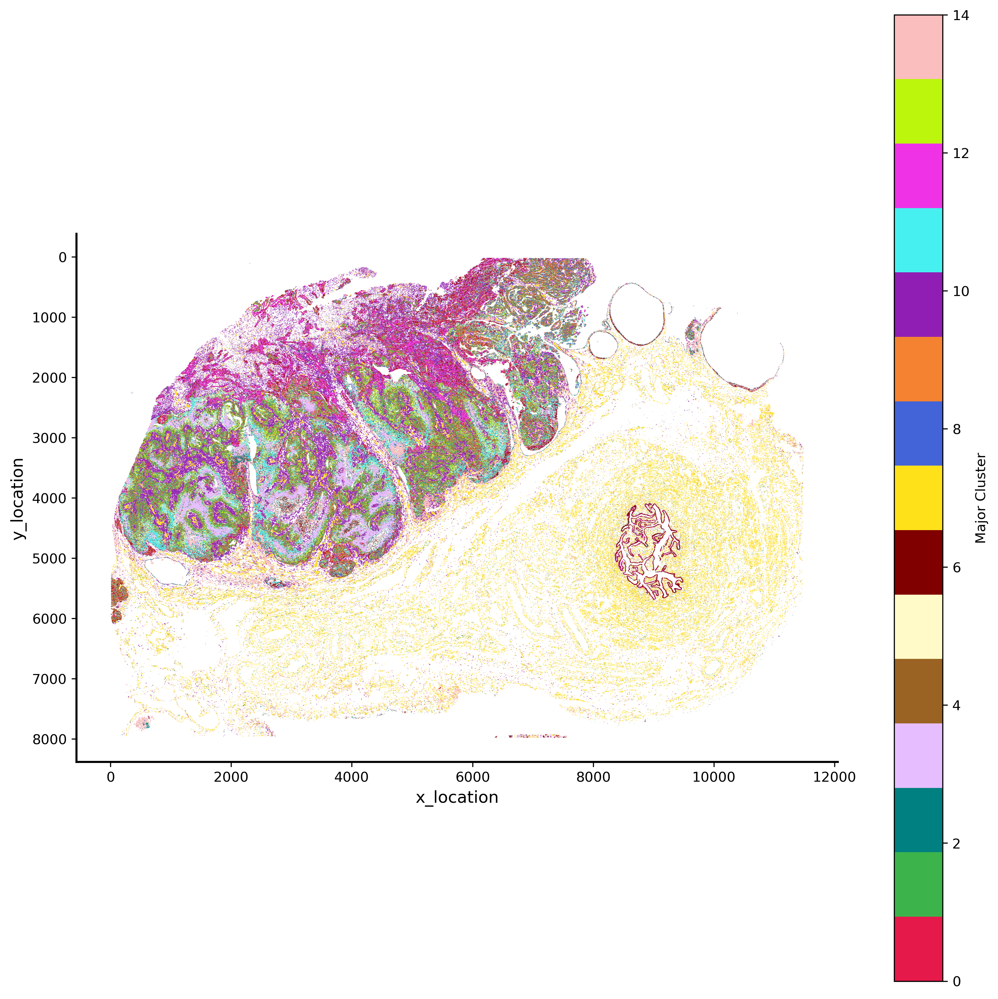

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.facecolor'] = 'black'
plt.style.use('default')
p_fig,ax = viz.plot_hex_bin(tx_meta = ovc_df.sample(50000000),
                          x="x_location",
                          y="y_location",
                          cluster_labels="gmm15",
                          bin_width=5,
                          bin_thresh=5,
                          cmap=customise_cmap_k15,
                          background_color="white",dpi=300,figsize=(10,10))
#ax.invert_yaxis()


## GMM 15 pixel plot

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.facecolor'] = 'black'
plt.style.use('dark_background')
# p_fig,ax = viz.plot_pixel(tx_meta = ovc_df.sample(50000000),
#                           x="x_location",
#                           cluster_labels="gmm15",
#                           y="y_location",
#                           pixel_size=0.5,min_points=1,
#                           join_method="avg",
#                           cmap=customise_cmap_k15,
#                           background_color="black",dpi=300,figsize=(10,10))
#ax.invert_yaxis()


# Zoom in 

In [ ]:
subset_df = ovc_df[(ovc_df["x_location"] < 500) & (ovc_df["y_location"] < 4000) ]


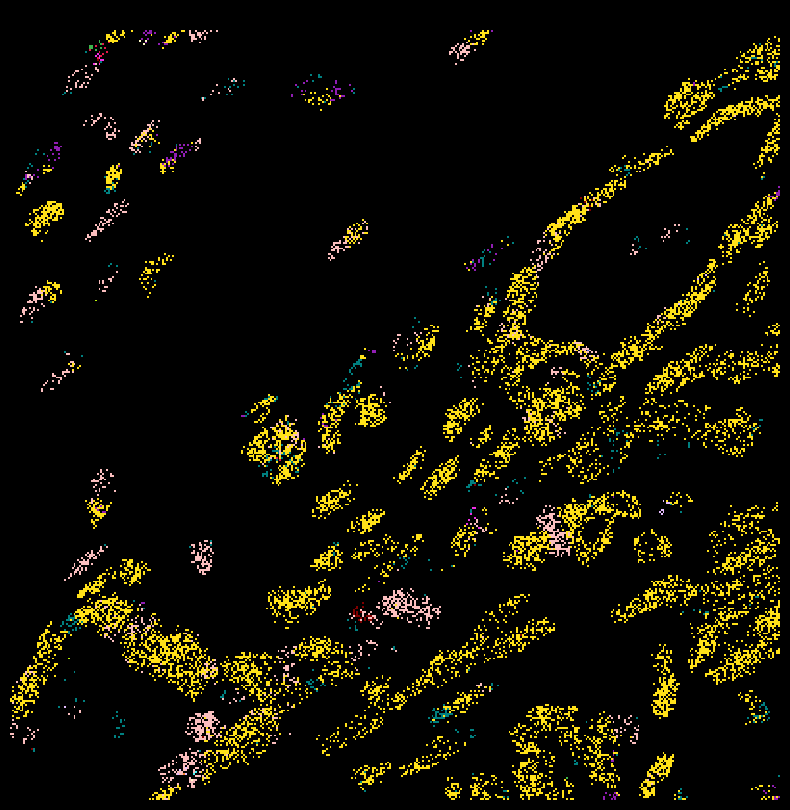

In [ ]:
plt.rcParams['figure.facecolor'] = 'black'
fig,ax = viz.plot_pixel(tx_meta = 
                    ovc_df[(ovc_df["x_location"] > 4800) & (ovc_df["x_location"] < 5000) & 
                         (ovc_df["y_location"] < 5000) & (ovc_df["y_location"] > 4800) ],
                              x="x_location",
                          cluster_labels="gmm15",
                          y="y_location",
                          pixel_size=0.5,
                          min_points=1,
                        cmap=customise_cmap_k15,
                        join_method="major",
                          background_color="black",dpi=100,figsize=(10,10))
ax.invert_yaxis()


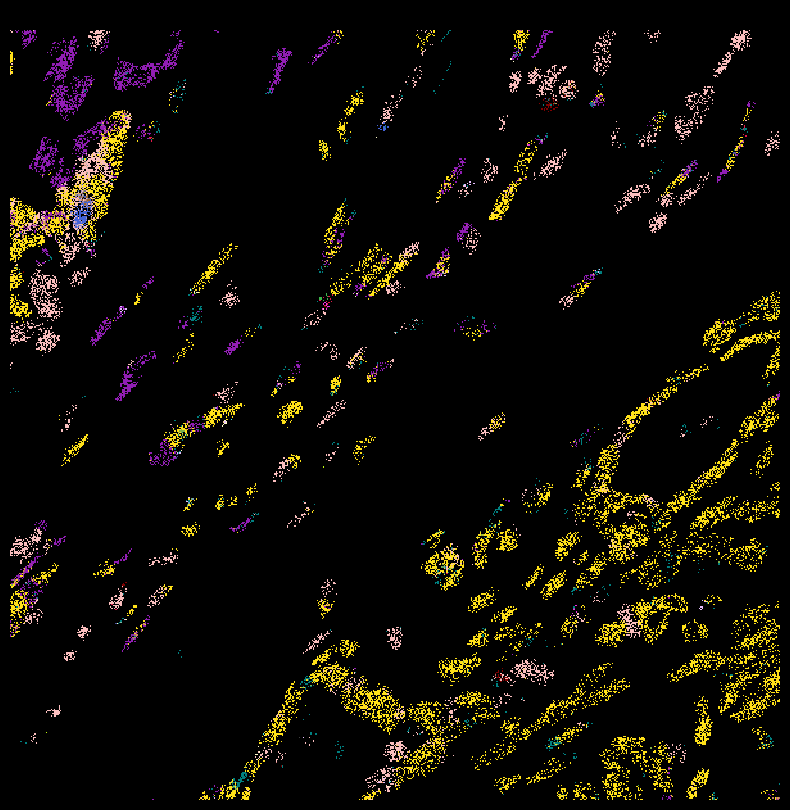

In [ ]:
plt.rcParams['figure.facecolor'] = 'black'
fig,ax = viz.plot_pixel(tx_meta = 
                    ovc_df[(ovc_df["x_location"] > 4700) & (ovc_df["x_location"] < 5000) & 
                         (ovc_df["y_location"] < 5000) & (ovc_df["y_location"] > 4700) ],
                              x="x_location",
                          cluster_labels="gmm15",
                          y="y_location",
                          pixel_size=0.5,
                          min_points=1,
                          cmap=customise_cmap_k15,
                          join_method="avg",
                          background_color="black",dpi=100,figsize=(10,10))
ax.invert_yaxis()


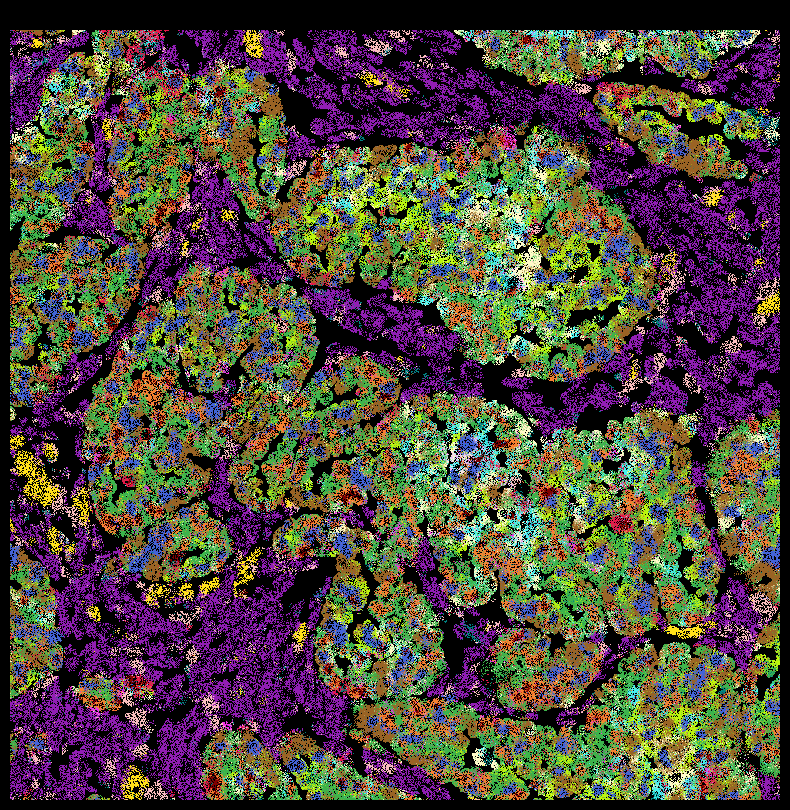

In [ ]:
plt.rcParams['figure.facecolor'] = 'black'
fig,ax = viz.plot_pixel(
    tx_meta = ovc_df[(ovc_df["x_location"] > 500) & (ovc_df["x_location"] < 1000) & 
                     (ovc_df["y_location"] < 4000) & (ovc_df["y_location"] > 3500) ],
    x="x_location",
    cluster_labels="gmm15",
    y="y_location",
    pixel_size=0.5,
    min_points=1,
    join_method="avg",
    cmap=customise_cmap_k15,
    background_color="black",dpi=100,figsize=(10,10))
ax.invert_yaxis()


## Save to file instead of plotting

In [ ]:
viz.plot_pixel(
    tx_meta = ovc_df[(ovc_df["x_location"] > 500) & (ovc_df["x_location"] < 1000) &
                     (ovc_df["y_location"] < 4000) & (ovc_df["y_location"] > 3500) ],
    x="x_location",
    cluster_labels="gmm15",
    y="y_location",
    pixel_size=0.5,
    min_points=1,
    cmap=customise_cmap_k15,
    join_method="avg",
    output_path = "../figures/crop1_5k.png",
    background_color="black"
)


Saved pixelated RGB image to ../figures/crop1_5k.png


# 15 molecular niches for whole tissue

![15 Niches](../figures/ovarian_caner_5k.png)


## GMM 10 hex bin plot

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


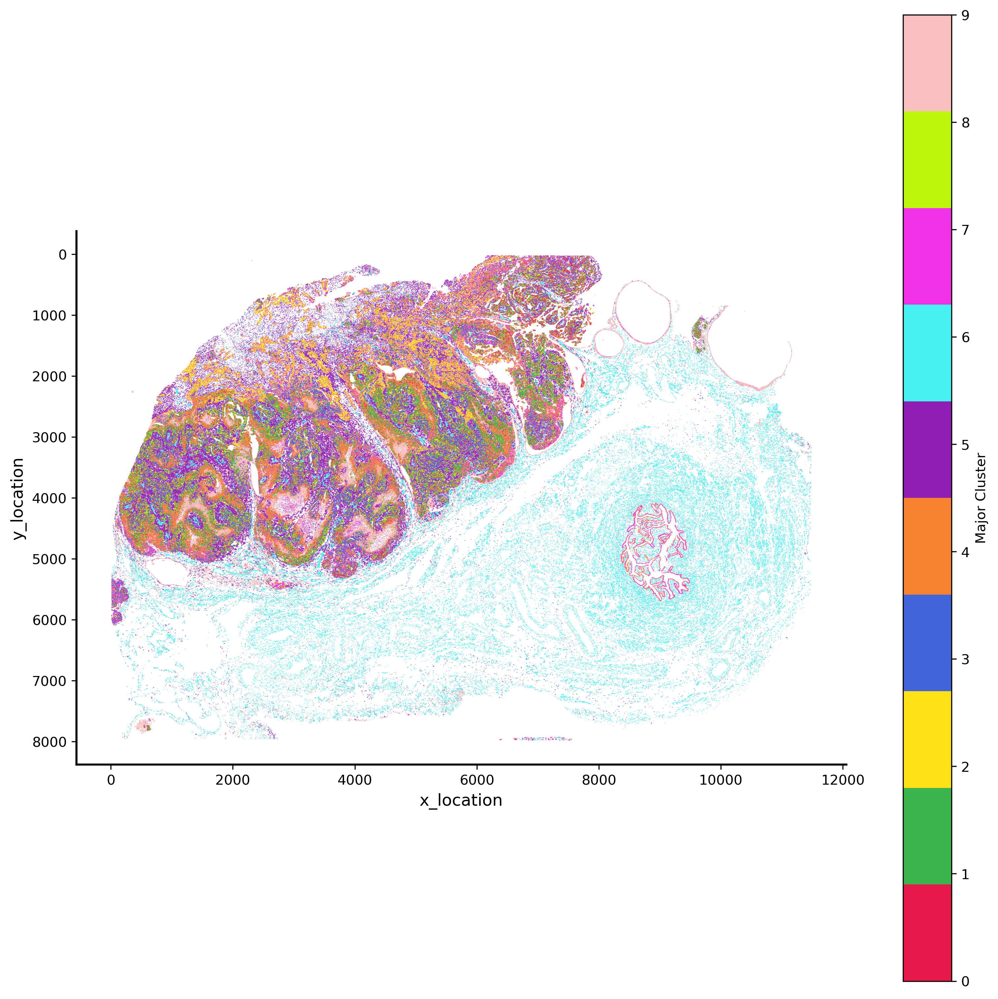

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.facecolor'] = 'black'
plt.style.use('default')
p_fig,ax = viz.plot_hex_bin(tx_meta = ovc_df.sample(50000000),
                          x="x_location",
                          y="y_location",
                          cluster_labels="gmm10",
                          bin_width=5,
                          bin_thresh=5,
                          cmap=customise_cmap_k10,
                          background_color="white",dpi=300,figsize=(10,10))
#ax.invert_yaxis()
